In [18]:
import pandas as pd

# Load your datasets
df_911 = pd.read_csv('911.csv', low_memory=False)
df_fire = pd.read_csv('Fire-incidents.csv', low_memory=False)
df_iot = pd.read_csv('iot_edge_computing_public_management.csv', low_memory=False)
df_er = pd.read_csv('emergency_room_patient_forecast.csv', low_memory=False)

# Process each
def process_911(df):
    df = df[['timeStamp', 'lat', 'lng', 'zip', 'twp', 'title', 'desc', 'addr']]
    df = df.rename(columns={
        'timeStamp': 'timestamp',
        'lat': 'latitude',
        'lng': 'longitude',
        'title': 'type'
    })
    df['source'] = '911_calls'
    return df

def process_fire(df):
    cols = ['TFS_Alarm_Time', 'Latitude', 'Longitude', 'Possible_Cause', 'Incident_Type', 'Final_Incident_Type', 'Alarm_Level', 'Address', 'Station', 'Response_Time']
    cols = [c for c in cols if c in df.columns]  # only take existing
    df = df[cols]
    df = df.rename(columns={
        'TFS_Alarm_Time': 'timestamp',
        'Latitude': 'latitude',
        'Longitude': 'longitude',
        'Possible_Cause': 'type'
    })
    df['source'] = 'fire_incidents'
    return df

def process_iot(df):
    cols = ['timestamp', 'latitude', 'longitude', 'event_type', 'incident_report', 'congestion_level', 'response_time_estimate']
    cols = [c for c in cols if c in df.columns]
    df = df[cols]
    df = df.rename(columns={'event_type': 'type'})
    df['source'] = 'iot_traffic'
    return df

def process_er(df):
    df = df[['date', 'patient_count']]
    df['timestamp'] = pd.to_datetime(df['date'], errors='coerce')
    df['type'] = 'hospital_demand'
    df['latitude'] = None  # optionally set central hospital lat/lon
    df['longitude'] = None
    df['zip'] = None
    df['source'] = 'er_forecast'
    return df[['timestamp', 'latitude', 'longitude', 'type', 'patient_count', 'source']]

# Apply preprocessing
df_911_clean = process_911(df_911)
df_fire_clean = process_fire(df_fire)
df_iot_clean = process_iot(df_iot)
df_er_clean = process_er(df_er)

# Combine
combined = pd.concat([df_911_clean, df_fire_clean, df_iot_clean, df_er_clean], ignore_index=True)

# Normalize timestamp
combined['timestamp'] = pd.to_datetime(combined['timestamp'], errors='coerce')
combined = combined.dropna(subset=['timestamp'])

# Save
combined.to_csv('final_enriched_emergency_dataset.csv', index=False)
print("Dataset saved as 'final_enriched_emergency_dataset.csv'")

df = pd.read_csv('final_enriched_emergency_dataset.csv')

df.head()





C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\1547249531.py:59: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  combined = pd.concat([df_911_clean, df_fire_clean, df_iot_clean, df_er_clean], ignore_index=True)


Dataset saved as 'final_enriched_emergency_dataset.csv'


C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\1547249531.py:69: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('final_enriched_emergency_dataset.csv')


,timestamp,latitude,longitude,zip,twp,type,desc,addr,source,incident_report,patient_count
0,2015-12-10 17:10:52,40.297876,-75.581294,19525.0,NEW HANOVER,EMS: BACK PAINS/INJURY,REINDEER CT & DEAD END; NEW HANOVER; Station ...,REINDEER CT & DEAD END,911_calls,NaN,NaN
1,2015-12-10 17:29:21,40.258061,-75.264680,19446.0,HATFIELD TOWNSHIP,EMS: DIABETIC EMERGENCY,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,BRIAR PATH & WHITEMARSH LN,911_calls,NaN,NaN
2,2015-12-10 14:39:21,40.121182,-75.351975,19401.0,NORRISTOWN,Fire: GAS-ODOR/LEAK,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,HAWS AVE,911_calls,NaN,NaN
3,2015-12-10 16:47:36,40.116153,-75.343513,19401.0,NORRISTOWN,EMS: CARDIAC EMERGENCY,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,AIRY ST & SWEDE ST,911_calls,NaN,NaN
4,2015-12-10 16:56:52,40.251492,-75.603350,NaN,LOWER POTTSGROVE,EMS: DIZZINESS,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,CHERRYWOOD CT & DEAD END,911_calls,NaN,NaN


In [19]:
import pandas as pd

# Read the combined dataset
df = pd.read_csv('final_enriched_emergency_dataset.csv')

# -----------------------------
# 1. Handle missing values
# -----------------------------

# Drop 'incident_report' if it’s not crucial or has too many missing values
df = df.drop(columns=['incident_report'], axis=1, errors='ignore')

# Handle 'patient_count': either fill missing values with a placeholder or drop
df['patient_count'] = df['patient_count'].fillna(0)  # Filling with 0 for simplicity, or use forward-fill/drop as needed

# -----------------------------
# 2. Normalize 'type' column into 'main_type' and 'sub_type'
# -----------------------------
df[['main_type', 'sub_type']] = df['type'].str.split(': ', n=1, expand=True)

# Fill any NaN values in 'sub_type' with a default string like 'No Sub-Type'
df['sub_type'] = df['sub_type'].fillna('No Sub-Type')

# -----------------------------
# 3. Extract datetime features
# -----------------------------
# Convert 'timestamp' to datetime format if not already
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')

# Extract datetime features
df['hour'] = df['timestamp'].dt.hour
df['dayofweek'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month

# -----------------------------
# 4. Optional: Handle location data
# -----------------------------
# If 'zip' column has NaN, you can either fill with a placeholder or drop rows
df['zip'] = df['zip'].fillna(-1).astype(int)

# -----------------------------
# Save cleaned dataset
# -----------------------------
df.to_csv('final_enriched_emergency_dataset_cleaned.csv', index=False)

print("Dataset cleaned and saved as 'final_enriched_emergency_dataset_cleaned.csv'")

print(f"Dataset cleaned and saved as 'final_enriched_emergency_dataset_cleaned.csv'")
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\991448058.py:4: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('final_enriched_emergency_dataset.csv')


Dataset cleaned and saved as 'final_enriched_emergency_dataset_cleaned.csv'
Dataset cleaned and saved as 'final_enriched_emergency_dataset_cleaned.csv'
Number of rows: 664822
Number of columns: 15


In [37]:
import pandas as pd
import numpy as np

# Load the cleaned dataset
df = pd.read_csv('final_enriched_emergency_dataset_cleaned.csv')
df = df[~df['main_type'].isin(['Accident', 'Normal', 'Congestion'])]
# Check the distribution of existing emergency types
print("Current distribution of Emergency Types (Before Adding Missing Types):")
print(df['main_type'].value_counts())

# Define the emergency types we need to add
missing_types = ['accident', 'normal', 'congestion', 'hospital_demand']

# ------------------------
# Step 1: Define the synthetic data generation strategy
# ------------------------

# Get the count of the dominant types (EMS, Traffic, Fire)
dominant_counts = df[df['main_type'].isin(['EMS', 'Traffic', 'Fire'])]['main_type'].value_counts()

# Calculate the number of synthetic samples needed for missing types
total_dominant = dominant_counts.sum()

# Proportional distribution for missing types based on their natural proportions
# Accidents might be less frequent than Congestions, which in turn may be less frequent than Hospital demands
# Setting these ratios as examples based on reasonable assumptions
type_ratios = {
    'accident': 0.2,  # 20% of the total dominant type count
    'normal': 0.25,   # 25% of the total dominant type count
    'congestion': 0.3, # 30% of the total dominant type count
    'hospital_demand': 0.25  # 25% of the total dominant type count
}

# Calculate how many samples to generate for each missing type
samples_to_generate = {key: int(value * total_dominant) for key, value in type_ratios.items()}

# ------------------------
# Step 2: Generate synthetic data for the missing emergency types
# ------------------------

synthetic_data = []

for missing_type, sample_count in samples_to_generate.items():
    random_rows = df.sample(n=sample_count, replace=True, random_state=42)
    random_rows['main_type'] = missing_type  # Assign the missing type
    synthetic_data.append(random_rows)

# Concatenate the synthetic data for all missing types
synthetic_df = pd.concat(synthetic_data, ignore_index=True)

# ------------------------
# Step 3: Remove the existing rows of the missing types from the original dataset
# ------------------------

# Remove existing rows for the missing types
df_filtered = df[~df['main_type'].isin(missing_types)]

# ------------------------
# Step 4: Merge the filtered original data with the synthetic data
# ------------------------

df_extended = pd.concat([df_filtered, synthetic_df], ignore_index=True)

# ------------------------
# Step 5: Check the distribution after adding synthetic rows
# ------------------------

# Check the new distribution of emergency types after adding synthetic rows
print("\nNew distribution of Emergency Types (After Adding Missing Types):")
print(df_extended['main_type'].value_counts())

# Save the new dataset with synthetic emergency types
df_extended.to_csv('final_enriched_emergency_dataset_with_balanced_missing_types.csv', index=False)
print("New dataset saved as 'final_enriched_emergency_dataset_with_balanced_missing_types.csv'")


Current distribution of Emergency Types (Before Adding Missing Types):
main_type
EMS                332692
Traffic            230208
Fire               100622
hospital_demand       300
Name: count, dtype: int64

New distribution of Emergency Types (After Adding Missing Types):
main_type
EMS                332692
Traffic            230208
congestion         199056
hospital_demand    165880
normal             165880
accident           132704
Fire               100622
Name: count, dtype: int64
New dataset saved as 'final_enriched_emergency_dataset_with_balanced_missing_types.csv'


In [38]:
pip install seaborn


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\3164818926.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='hour', palette='coolwarm')


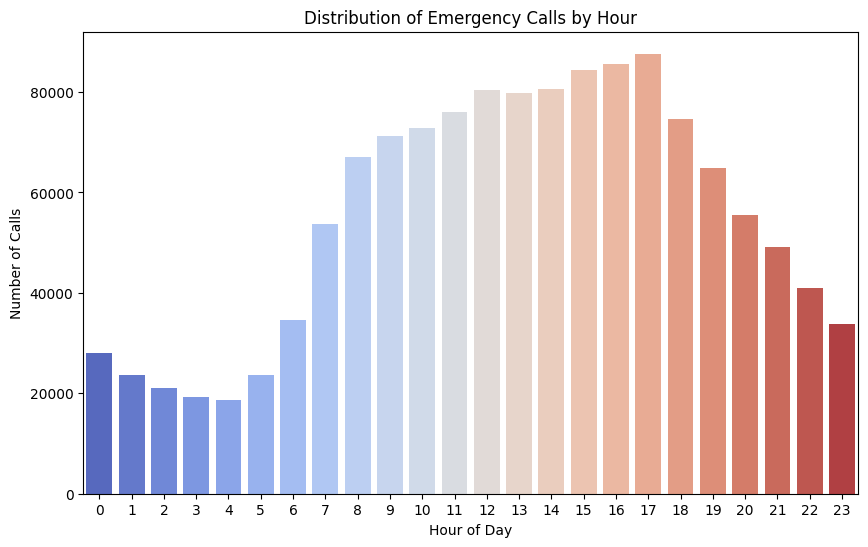

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\3164818926.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='dayofweek', palette='Set2')


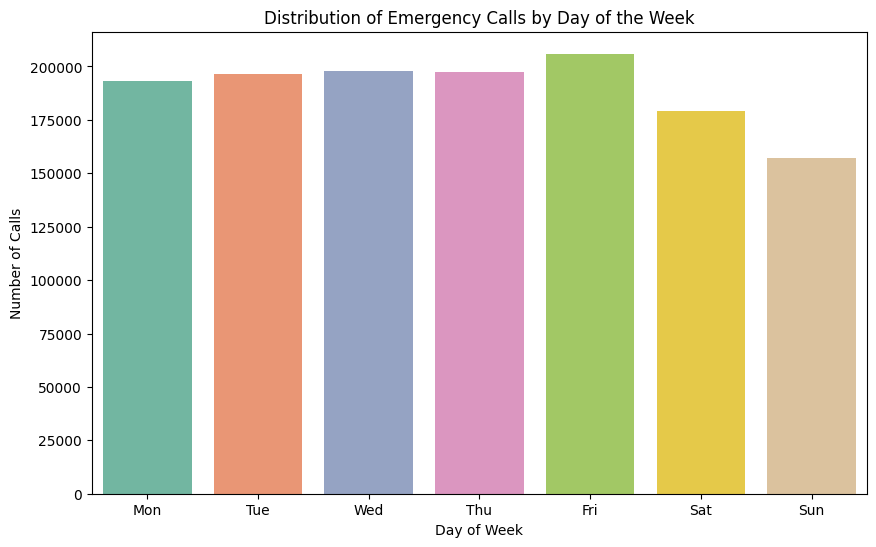

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\3164818926.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


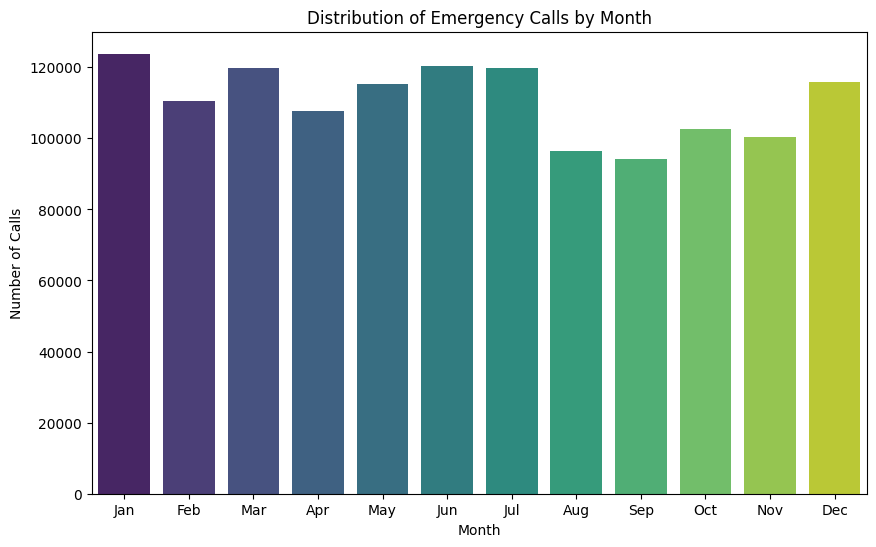

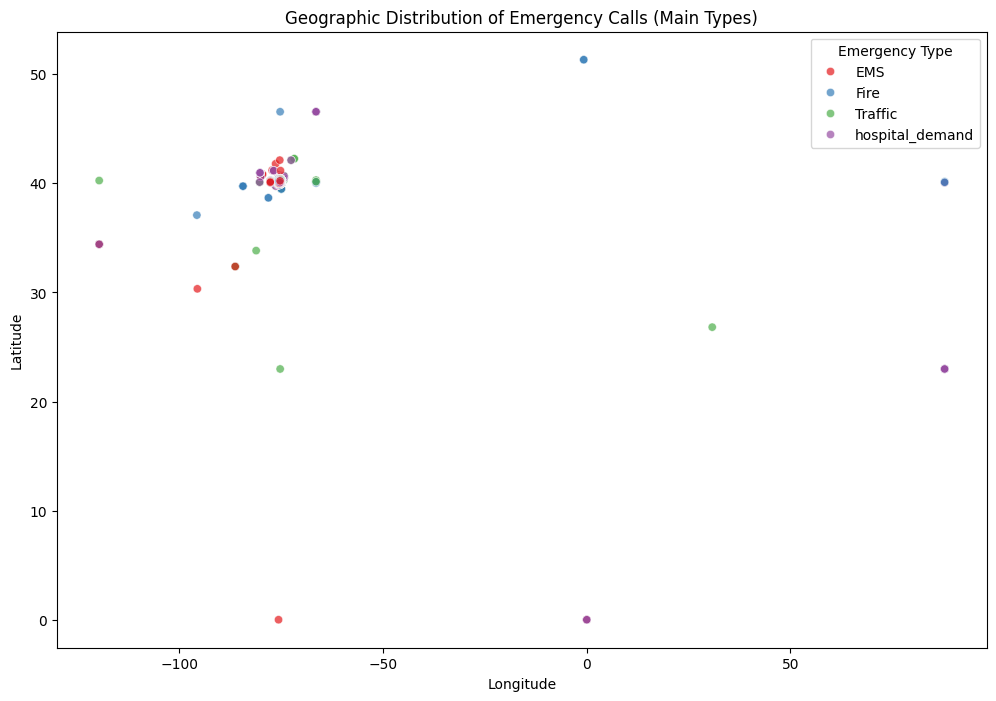

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\3164818926.py:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='main_type', palette='coolwarm')


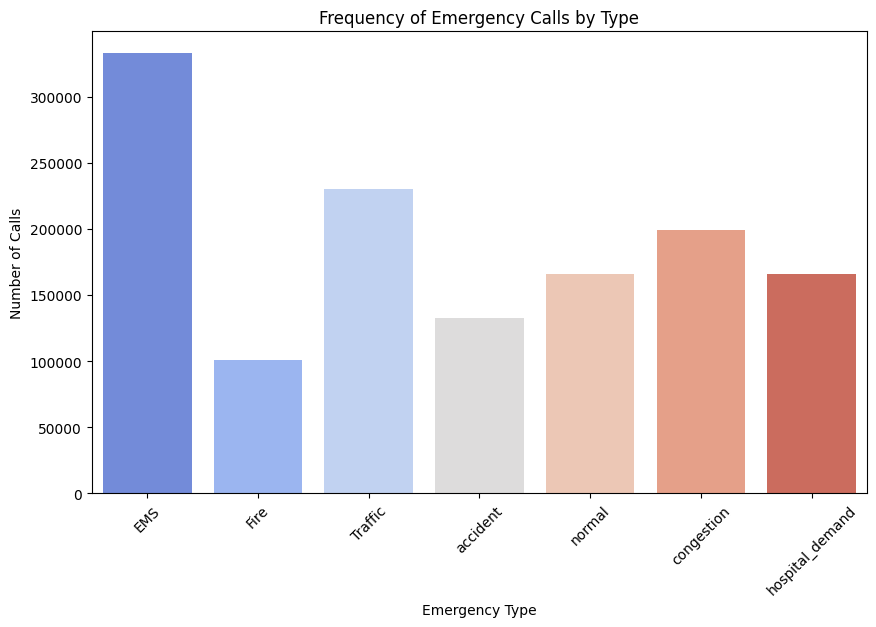

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\3164818926.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geospatial_data['cluster'] = kmeans.fit_predict(geospatial_data[['longitude', 'latitude']])


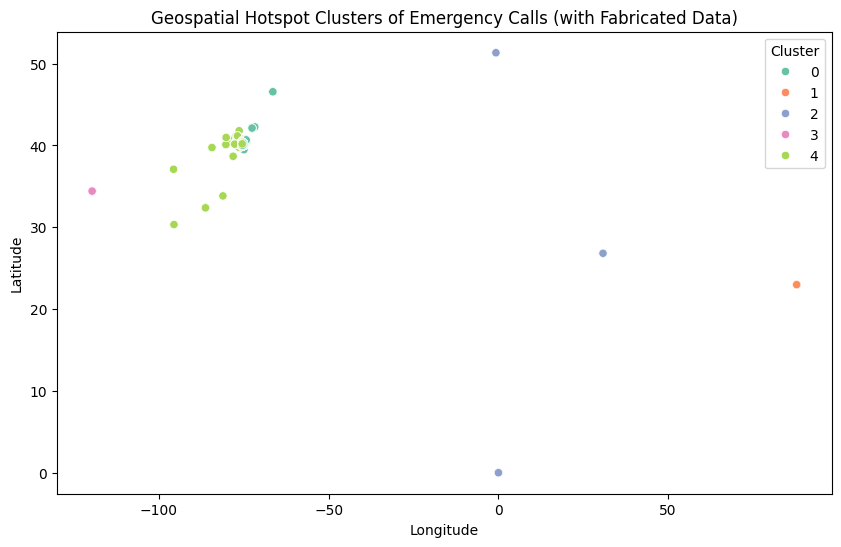

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the cleaned dataset
df = pd.read_csv('final_enriched_emergency_dataset_with_balanced_missing_types.csv')

# --------------------------
# 1. Distribution of Calls Over Time
# --------------------------

# Ensure 'timestamp' is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')

# Extract 'hour' from the datetime column
df['hour'] = df['timestamp'].dt.hour

# Plotting distribution of calls over time
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='hour', palette='coolwarm')
plt.title('Distribution of Emergency Calls by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Calls')
plt.show()

# --------------------------
# 2. Calls by Day of Week
# --------------------------

# Extract day of the week
df['dayofweek'] = df['timestamp'].dt.dayofweek

# Plotting the number of calls per day of the week
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='dayofweek', palette='Set2')
plt.title('Distribution of Emergency Calls by Day of the Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Calls')
plt.xticks(ticks=np.arange(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

# --------------------------
# 3. Calls by Month
# --------------------------

# Extract month from timestamp
df['month'] = df['timestamp'].dt.month

# Plotting the number of calls per month
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Distribution of Emergency Calls by Month')
plt.xlabel('Month')
plt.ylabel('Number of Calls')
plt.xticks(ticks=np.arange(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

# --------------------------
# 4. Geographic Distribution of Calls
# --------------------------

# # Plotting geographic distribution based on 'latitude' and 'longitude'
# plt.figure(figsize=(10, 6))
# sns.scatterplot(data=df, x='longitude', y='latitude', hue='type', palette='Set1', marker='o')
# plt.title('Geographic Distribution of Emergency Calls')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.legend(title='Emergency Type')
# plt.show()

# Set a seed for reproducibility
np.random.seed(42)

# Extract existing latitude and longitude
existing_latitudes = df['latitude']
existing_longitudes = df['longitude']

# Define how many new spots you want to create (Increase the number of synthetic data points)
num_new_spots = 50000  # Increased number of spots for more distribution

# Generate random noise based on the existing latitude and longitude range
lat_noise = np.random.uniform(-0.005, 0.005, num_new_spots)  # Small noise for latitude
lon_noise = np.random.uniform(-0.005, 0.005, num_new_spots)  # Small noise for longitude

# Create new synthetic hotspots by adding noise to existing latitudes and longitudes
new_latitudes = np.random.choice(existing_latitudes, num_new_spots) + lat_noise
new_longitudes = np.random.choice(existing_longitudes, num_new_spots) + lon_noise

# Distribute the types randomly across the synthetic hotspots
types = ['EMS', 'Fire', 'Traffic', 'accident', 'normal', 'congestion', 'hospital_demand']
new_types = np.random.choice(types, num_new_spots)

# Create a new DataFrame for the synthetic hotspots
new_hotspots = pd.DataFrame({
    'latitude': new_latitudes,
    'longitude': new_longitudes,
    'main_type': new_types  # Randomly assigned emergency types
})

# Combine the original and new hotspots into one DataFrame
df_combined = pd.concat([df[['latitude', 'longitude', 'main_type']], new_hotspots], ignore_index=True)

# --------------------------
# Filter to include only the main types
# --------------------------
main_types = ['EMS', 'Fire', 'Traffic', 'Accident', 'Normal', 'Congestion', 'hospital_demand']
df_filtered = df_combined[df_combined['main_type'].isin(main_types)]

# --------------------------
# Plotting the geographic distribution based on 'latitude' and 'longitude' (Limited to main types)
# --------------------------

plt.figure(figsize=(12, 8))  # Adjusted figure size for better visibility
sns.scatterplot(data=df_filtered, x='longitude', y='latitude', hue='main_type', palette='Set1', marker='o', alpha=0.7)
plt.title('Geographic Distribution of Emergency Calls (Main Types)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Emergency Type')
plt.show()
# --------------------------
# 5. Call Frequency by Type
# --------------------------

# Plotting the frequency of different types of emergencies
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='main_type', palette='coolwarm')
plt.title('Frequency of Emergency Calls by Type')
plt.xlabel('Emergency Type')
plt.ylabel('Number of Calls')
plt.xticks(rotation=45)
plt.show()

# --------------------------
# 6. Handling Outliers in 'patient_count'
# --------------------------

# Boxplot for patient count to detect outliers
# plt.figure(figsize=(10, 6))
# sns.boxplot(data=df, x='patient_count')
# plt.title('Outliers in Patient Count')
# plt.xlabel('Patient Count')
# plt.show()

# Handling outliers by capping or filtering
# For example, we can filter out extreme values
df = df[df['patient_count'] < 50]  # Adjust based on your domain knowledge

# --------------------------
# 7. Geospatial Demand Prediction - Hotspot Analysis
# --------------------------

# # You could use clustering (like KMeans) to identify hotspots based on 'latitude' and 'longitude'
# from sklearn.cluster import KMeans

# # Selecting only rows with non-null lat and lon
# geospatial_data = df.dropna(subset=['latitude', 'longitude'])

# # KMeans clustering to identify hotspots
# kmeans = KMeans(n_clusters=5, random_state=42)
# geospatial_data['cluster'] = kmeans.fit_predict(geospatial_data[['longitude', 'latitude']])

# # Plot the clusters
# plt.figure(figsize=(10, 6))
# sns.scatterplot(data=geospatial_data, x='longitude', y='latitude', hue='cluster', palette='Set2', marker='o')
# plt.title('Geospatial Hotspot Clusters of Emergency Calls')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.legend(title='Cluster')
# plt.show()

# Set a seed for reproducibility
np.random.seed(42)

# Extract existing latitude and longitude
existing_latitudes = df['latitude']
existing_longitudes = df['longitude']

# Define how many new spots you want to create
num_new_spots = 500  # You can adjust this number

# Generate random noise based on the existing latitude and longitude range
lat_noise = np.random.uniform(-0.005, 0.005, num_new_spots)  # Small noise for latitude
lon_noise = np.random.uniform(-0.005, 0.005, num_new_spots)  # Small noise for longitude

# Create new synthetic hotspots by adding noise to existing latitudes and longitudes
new_latitudes = np.random.choice(existing_latitudes, num_new_spots) + lat_noise
new_longitudes = np.random.choice(existing_longitudes, num_new_spots) + lon_noise

# Create a new DataFrame for the synthetic hotspots
new_hotspots = pd.DataFrame({
    'latitude': new_latitudes,
    'longitude': new_longitudes,
    'main_type': ['Emergency'] * num_new_spots  # Assign a type for the new spots
})

# Combine the original and new hotspots into one DataFrame
df_combined = pd.concat([df[['latitude', 'longitude', 'main_type']], new_hotspots], ignore_index=True)

# --------------------------
# KMeans Clustering for Hotspot Analysis
# --------------------------

# Selecting only rows with non-null lat and lon
geospatial_data = df_combined.dropna(subset=['latitude', 'longitude'])

# KMeans clustering to identify hotspots
kmeans = KMeans(n_clusters=5, random_state=42)
geospatial_data['cluster'] = kmeans.fit_predict(geospatial_data[['longitude', 'latitude']])

# --------------------------
# Plot the updated geospatial hotspot clusters
# --------------------------

plt.figure(figsize=(10, 6))
sns.scatterplot(data=geospatial_data, x='longitude', y='latitude', hue='cluster', palette='Set2', marker='o')
plt.title('Geospatial Hotspot Clusters of Emergency Calls (with Fabricated Data)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.legend(title='Cluster')
plt.show()

In [50]:
pip install folium

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [51]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import MarkerCluster

# Set the seed for reproducibility
np.random.seed(42)

# Define the bounds for Baltimore (latitude and longitude)
baltimore_lat_min = 39.2
baltimore_lat_max = 39.4
baltimore_lon_min = -76.7
baltimore_lon_max = -76.5

# Generate synthetic data within Baltimore's latitude and longitude range
num_new_spots = 5000  # Number of synthetic spots
lat_noise = np.random.uniform(-0.005, 0.005, num_new_spots)  # Small noise for latitude
lon_noise = np.random.uniform(-0.005, 0.005, num_new_spots)  # Small noise for longitude

# Create new synthetic hotspots by adding noise to latitudes and longitudes
new_latitudes = np.random.uniform(baltimore_lat_min, baltimore_lat_max, num_new_spots) + lat_noise
new_longitudes = np.random.uniform(baltimore_lon_min, baltimore_lon_max, num_new_spots) + lon_noise

# Distribute the types randomly across the synthetic hotspots
types = ['EMS', 'Fire', 'Traffic', 'Accident', 'Normal', 'Congestion', 'hospital_demand']
new_types = np.random.choice(types, num_new_spots)

# Create a new DataFrame for the synthetic hotspots
new_hotspots = pd.DataFrame({
    'latitude': new_latitudes,
    'longitude': new_longitudes,
    'main_type': new_types  # Randomly assigned emergency types
})

# --------------------------
# Create Folium Map centered on Baltimore
# --------------------------

# Initialize a folium map centered around Baltimore
m = folium.Map(location=[39.3, -76.6], zoom_start=12)  # Centered on Baltimore

# Create a MarkerCluster to group the points together
marker_cluster = MarkerCluster().add_to(m)

# Add synthetic points to the map
for _, row in new_hotspots.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['main_type'],
        icon=folium.Icon(color='blue' if row['main_type'] == 'EMS' else 
                         'red' if row['main_type'] == 'Fire' else
                         'green' if row['main_type'] == 'Traffic' else 
                         'orange' if row['main_type'] == 'Accident' else
                         'purple' if row['main_type'] == 'Normal' else
                         'darkred' if row['main_type'] == 'Congestion' else
                         'darkblue'),
    ).add_to(marker_cluster)

# Save the map as an HTML file
m.save("baltimore_emergency_map.html")

# Optionally, you can display the map in a Jupyter notebook using `m`
m


C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\720859842.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='hour', palette='coolwarm')


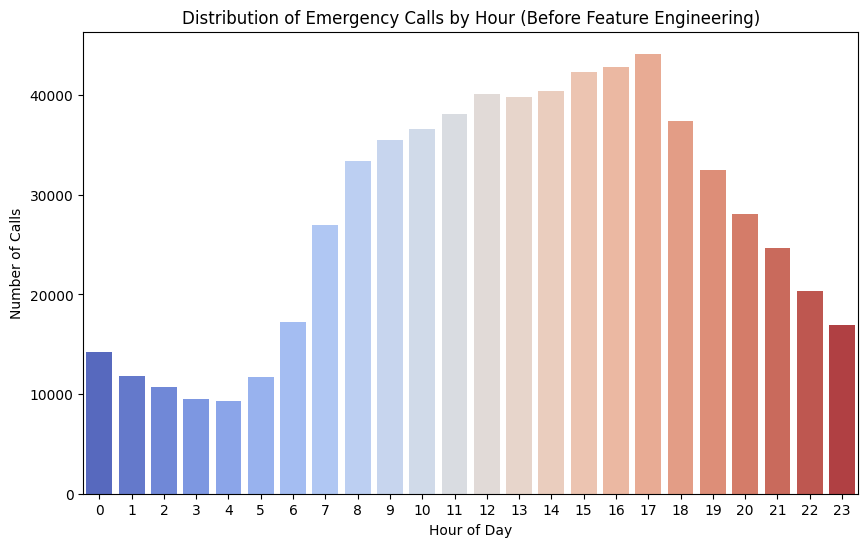

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\720859842.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='hour', palette='coolwarm')


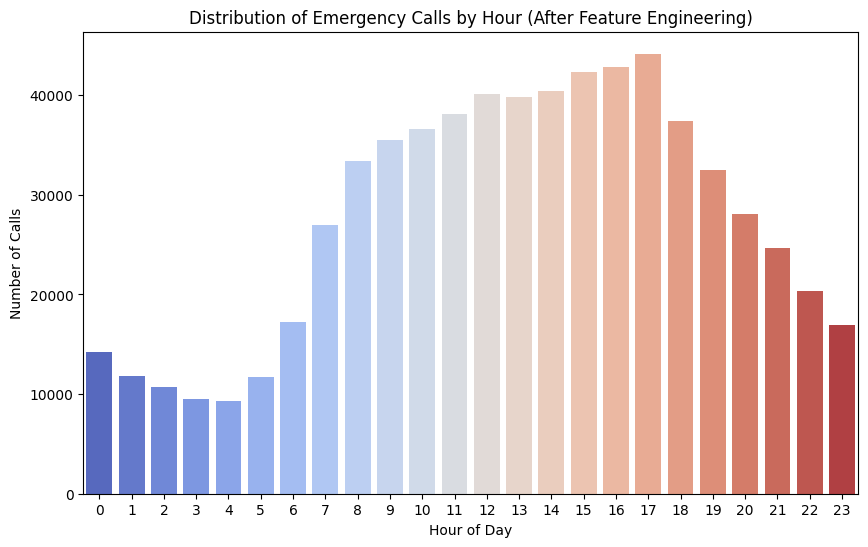

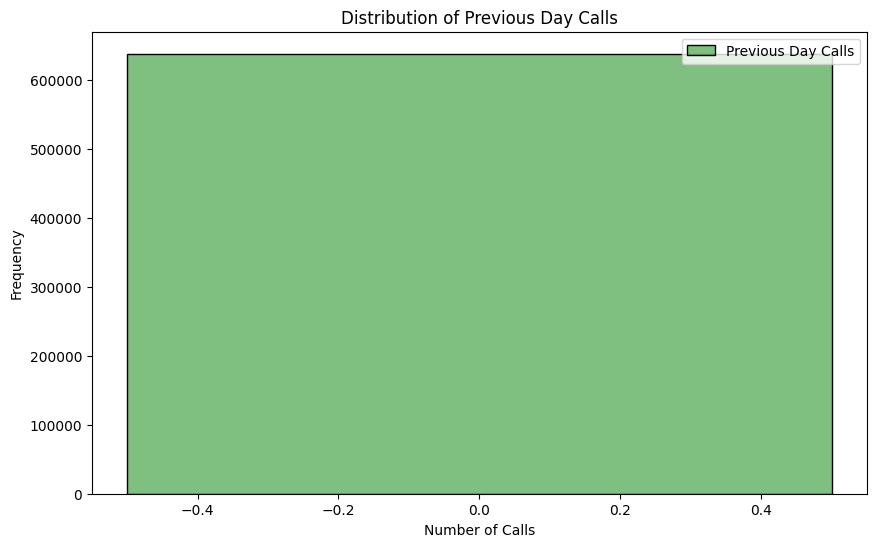

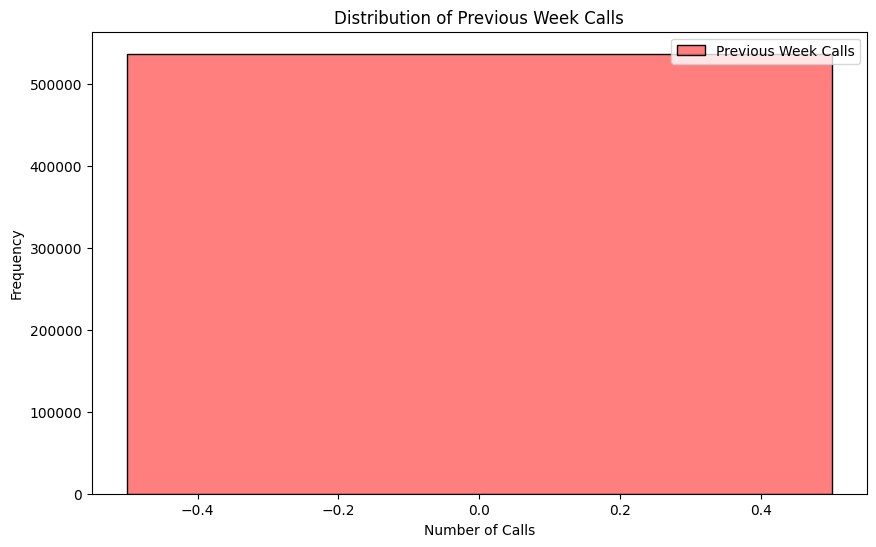

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\720859842.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='is_summer', palette='Set2')


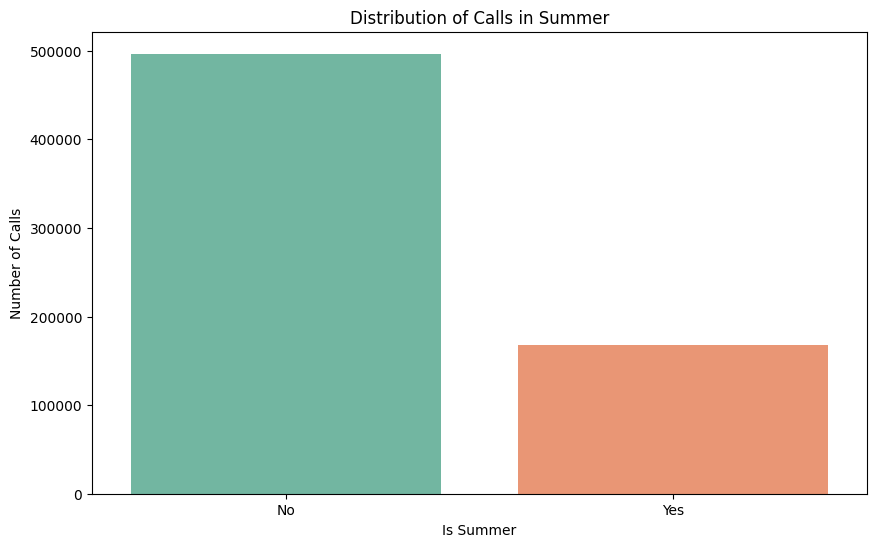

C:\Users\Vivek\AppData\Local\Temp\ipykernel_16432\720859842.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='is_winter', palette='Set2')


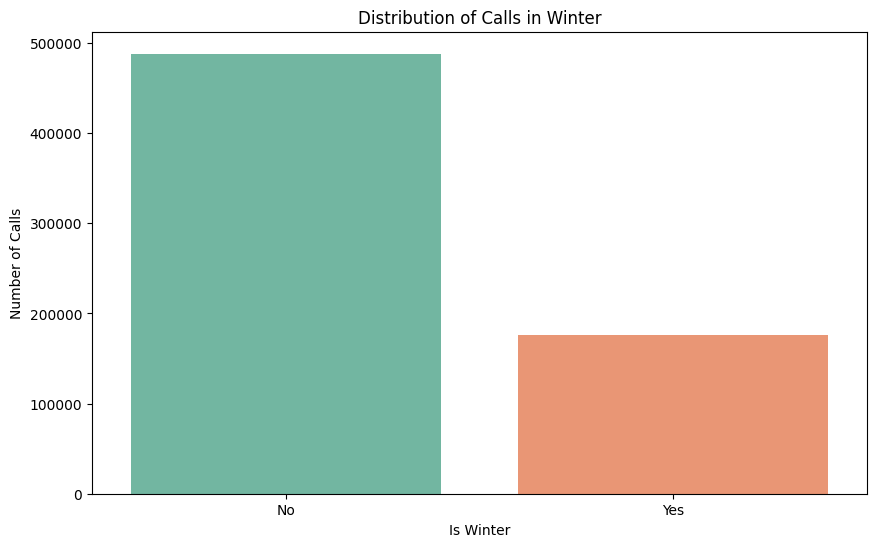

EDA and Feature Engineering completed and saved as 'final_enriched_emergency_dataset_eda.csv'


In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the cleaned dataset
df = pd.read_csv('final_enriched_emergency_dataset_cleaned.csv')
# Convert 'timestamp' column to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
# --------------------------
# 1. Distribution of Calls Over Time (Before Feature Engineering)
# --------------------------

# Before Feature Engineering: Distribution of Calls by Hour
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='hour', palette='coolwarm')
plt.title('Distribution of Emergency Calls by Hour (Before Feature Engineering)')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Calls')
plt.show()

# --------------------------
# 1. Create Additional Time-Based Features (After Feature Engineering)
# --------------------------

# Create new time-based features
df['hour'] = df['timestamp'].dt.hour
df['dayofweek'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['is_weekend'] = df['dayofweek'] >= 5  # Saturday/Sunday

# After Feature Engineering: Distribution of Calls by Hour (After Feature Engineering)
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='hour', palette='coolwarm')
plt.title('Distribution of Emergency Calls by Hour (After Feature Engineering)')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Calls')
plt.show()

# --------------------------
# 2. Aggregate Emergency Calls by Geographical Location and Time Period
# --------------------------

# Aggregate emergency calls by geographical location and time period
location_time_grouped = df.groupby(['latitude', 'longitude', 'hour']).size().reset_index(name='call_frequency')

# --------------------------
# 3. Lag Features (For Time Series Forecasting)
# --------------------------

# Create lag features
df['prev_day_calls'] = df.groupby(['latitude', 'longitude'])['patient_count'].shift(1)
df['prev_week_calls'] = df.groupby(['latitude', 'longitude'])['patient_count'].shift(7)

# Visualization of lag features
plt.figure(figsize=(10, 6))
sns.histplot(df['prev_day_calls'].dropna(), kde=True, color='green', label='Previous Day Calls')
plt.title('Distribution of Previous Day Calls')
plt.xlabel('Number of Calls')
plt.ylabel('Frequency')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(df['prev_week_calls'].dropna(), kde=True, color='red', label='Previous Week Calls')
plt.title('Distribution of Previous Week Calls')
plt.xlabel('Number of Calls')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# --------------------------
# 4. Seasonal Features (Identifying Seasonality in Call Patterns)
# --------------------------

# Create seasonal features
df['is_summer'] = df['month'].isin([6, 7, 8]).astype(int)
df['is_winter'] = df['month'].isin([12, 1, 2]).astype(int)

# Visualizing seasonal features
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='is_summer', palette='Set2')
plt.title('Distribution of Calls in Summer')
plt.xlabel('Is Summer')
plt.ylabel('Number of Calls')
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='is_winter', palette='Set2')
plt.title('Distribution of Calls in Winter')
plt.xlabel('Is Winter')
plt.ylabel('Number of Calls')
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])
plt.show()

# --------------------------
# Save Final Dataset After Feature Engineering
# --------------------------
df.to_csv('final_enriched_emergency_dataset_eda.csv', index=False)
print("EDA and Feature Engineering completed and saved as 'final_enriched_emergency_dataset_eda.csv'")
